In [ ]:
%pip install seaborn japanize-matplotlib

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Text(0, 0.5, 'A (mV*t)')

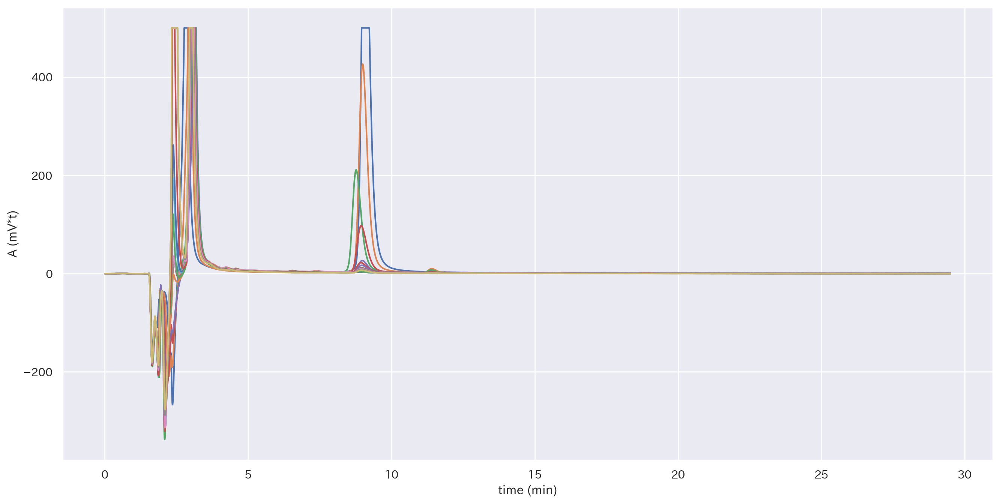

In [ ]:
# ドパミン濃度の高いサンプルは、最初のくぼみが左にずれている
# これは、ドパミン量とトレードオフで、
# マイナスのピークを作る物質の量が少なくなっていると考えられる
# 純粋なACSF,K±ACSF,移動層のデータもとって
# 純粋なノイズ、基本のラインのデータもほしい
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
sns.set()
import japanize_matplotlib
japanize_matplotlib.japanize()

# Macの時
#path_to_csv = ''
# Dockerの時
#path_to_csv = '/home/biofunc/replace_powerchrome/100521_SH001_DA@NAc.txt'
#Colabの時
path_to_csv = '/content/drive/MyDrive/Colab Notebooks/powerchrom_data/100521_SH001_DA@NAc.txt'

HPLC_raw = pd.read_table(path_to_csv, header=None)
index_for_crop = HPLC_raw.loc[HPLC_raw[0] == '# min'].index
index_for_crop = np.append(index_for_crop, len(HPLC_raw) + 1)
HPLC_cropped = [HPLC_raw.iloc[index_for_crop[i]+1:index_for_crop[i+1], 0:2].astype('float64') for i in range(len(index_for_crop)-1)]

fig, ax = plt.subplots(figsize=(16, 8), dpi=200)
#for i in range(7,8):
for i in range(len(HPLC_cropped)):
    plt.plot(HPLC_cropped[i][0], HPLC_cropped[i][1])
plt.xlabel('time (min)')
plt.ylabel('A (mV*t)')


Text(0, 0.5, 'A (mV*t)')

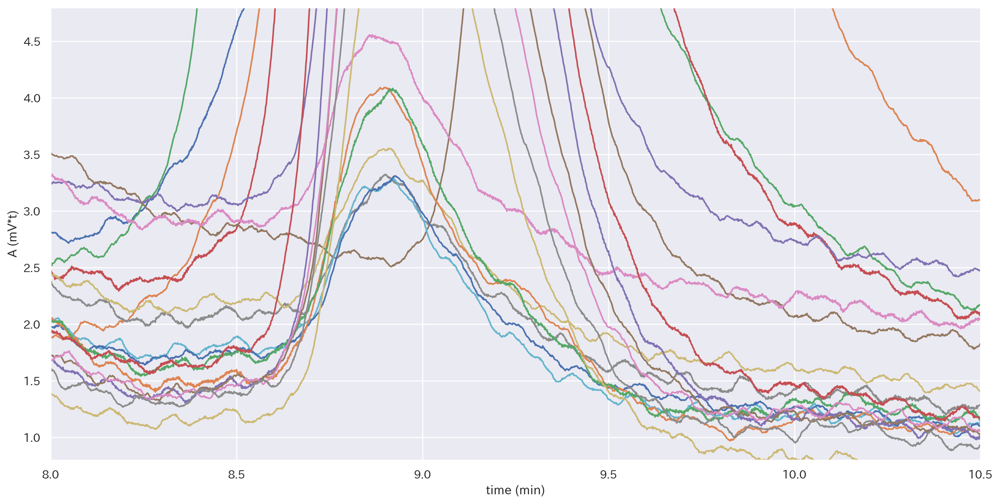

In [ ]:
# ドーパミンのピークの部分にズームアップ
fig, ax = plt.subplots(figsize=(16, 8), dpi=200)
#for i in range(7,8):
for i in range(len(HPLC_cropped)):
    plt.plot(HPLC_cropped[i][0], HPLC_cropped[i][1])
plt.xlim(8, 10.5)
plt.ylim(0.8, 4.8)
plt.xlabel('time (min)')
plt.ylabel('A (mV*t)')

Text(0, 0.5, 'A (mV*t)')

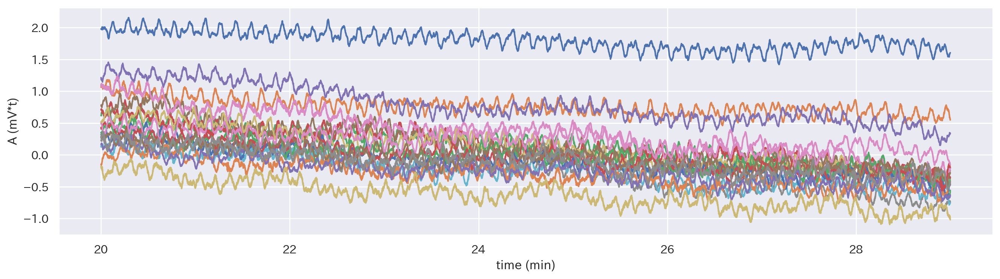

In [ ]:
# 後ろの方の比較的穏やかな部分のノイズを伸ばしたものを、全体から引き算すればいいのでは？
# ６〜７Hzのノイズに見える
#===========================================
time_head = 20
time_tail = 29
fq_high_limit = 60
#===========================================
plt.figure(figsize=(16, 4), dpi=200)
for i in range(len(HPLC_cropped)):
#for i in [1,6,7,18]:
    N = len(HPLC_cropped[i][0])
    dt = (HPLC_cropped[i][0].iat[-1] - HPLC_cropped[i][0].iat[0]) / N
    time_head_index = np.abs(np.array(HPLC_cropped[i][0]) - time_head).argmin()
    time_tail_index = np.abs(np.array(HPLC_cropped[i][0]) - time_tail).argmin()

    filter = np.fft.fft(HPLC_cropped[i][1][time_head_index:time_tail_index])
    filter_fq = np.linspace(0, 1.0/dt, len(filter))
    filter_ifft_real = np.fft.ifft(filter).real * 2
    plt.plot(HPLC_cropped[i][0][time_head_index:time_tail_index], filter_ifft_real)

plt.xlabel('time (min)')
plt.ylabel('A (mV*t)')

Text(0, 0.5, 'Amplitude')

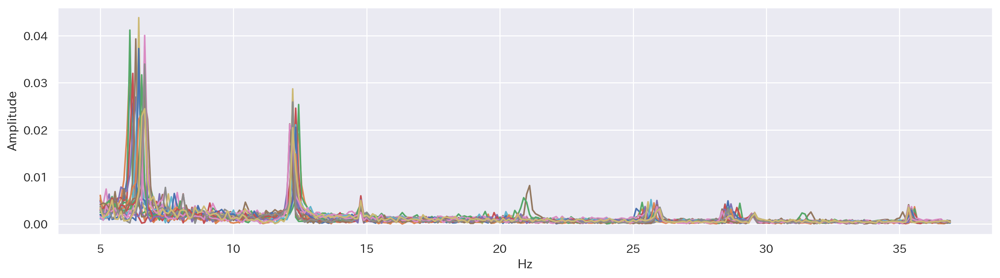

In [ ]:
# 後ろの穏やかな部分の範囲をフーリエ変換
# 一定の位置にピークを形成しているので、機械的な要因による周期的な成分が含まれていると考えられる
# 振幅が大きい　＝　影響が大きい
# 直流成分を引き算した後、scipy signalでピーク検出して、ノイズを抽出する
# サンプル間でノイズを比較して、周波数を正規化
# 伸ばしたノイズを頭の方のノイズと比較して、微調整
#===========================================
time_head = 20
time_tail = 29
fq_head = 5
fq_tail = 37
#===========================================
plt.figure(figsize=(16, 4), dpi=200)
for i in range(len(HPLC_cropped)):
#for i in [6,7,8,9,10]:
    N = len(HPLC_cropped[i][0])
    dt = (HPLC_cropped[i][0].iat[-1] - HPLC_cropped[i][0].iat[0]) / N
    fq = np.linspace(0, 1.0/dt, N) 
    time_head_index = np.abs(np.array(HPLC_cropped[i][0]) - time_head).argmin()
    time_tail_index = np.abs(np.array(HPLC_cropped[i][0]) - time_tail).argmin()


    filter = np.fft.fft(HPLC_cropped[i][1][time_head_index:time_tail_index])
    filter = filter - np.average(filter)
    filter_fq = np.linspace(0, 1.0/dt, len(filter))
    filter_fq_head_index = np.abs(filter_fq - fq_head).argmin()
    filter_fq_tail_index = np.abs(filter_fq - fq_tail).argmin()
    filter_abs_amp = np.abs(filter) / len(filter) * 2
    filter_abs_amp[0] = filter_abs_amp[0] / 2

    plt.plot(filter_fq[filter_fq_head_index:filter_fq_tail_index], filter_abs_amp[filter_fq_head_index:filter_fq_tail_index])
plt.xlabel('Hz')
plt.ylabel('Amplitude')

Text(0, 0.5, 'Amplitude')

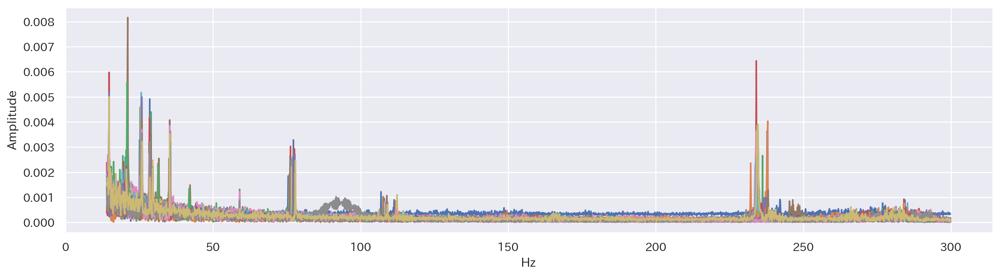

In [ ]:
# 高周波にもピークはあった
#===========================================
time_head = 20
time_tail = 29
fq_head = 14
fq_tail = 300
#===========================================
plt.figure(figsize=(16, 4), dpi=200)
for i in range(len(HPLC_cropped)):
#for i in [6,7,8,9,10]:
    N = len(HPLC_cropped[i][0])
    dt = (HPLC_cropped[i][0].iat[-1] - HPLC_cropped[i][0].iat[0]) / N
    fq = np.linspace(0, 1.0/dt, N) 
    time_head_index = np.abs(np.array(HPLC_cropped[i][0]) - time_head).argmin()
    time_tail_index = np.abs(np.array(HPLC_cropped[i][0]) - time_tail).argmin()


    filter = np.fft.fft(HPLC_cropped[i][1][time_head_index:time_tail_index])
    filter = filter - np.average(filter)
    filter_fq = np.linspace(0, 1.0/dt, len(filter))
    filter_fq_head_index = np.abs(filter_fq - fq_head).argmin()
    filter_fq_tail_index = np.abs(filter_fq - fq_tail).argmin()
    filter_abs_amp = np.abs(filter) / len(filter) * 2
    filter_abs_amp[0] = filter_abs_amp[0] / 2

    plt.plot(filter_fq[filter_fq_head_index:filter_fq_tail_index], filter_abs_amp[filter_fq_head_index:filter_fq_tail_index])
plt.xlabel('Hz')
plt.ylabel('Amplitude')

Text(0, 0.5, 'Amplitude')

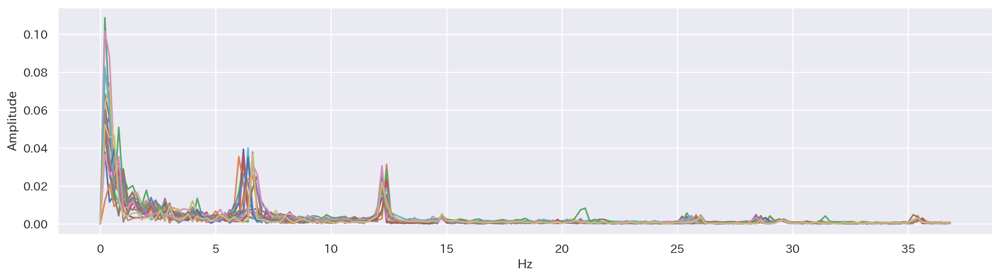

In [ ]:
# 後ろの穏やかな部分の範囲をフーリエ変換
# 周波数0の成分が意味わからんのでググったら、直流成分とのこと
# 平均を引き算することで、直流成分を引いたことにしてみた
# 0じゃないけど、それにめちゃ近い周波数は相変わらず出てくる
#===========================================
time_head = 24
time_tail = 29
fq_head = 0
fq_tail = 37
#===========================================
plt.figure(figsize=(16, 4), dpi=300)
for i in range(len(HPLC_cropped)):
#for i in [6,7,8,9,10]:
    N = len(HPLC_cropped[i][0])
    dt = (HPLC_cropped[i][0].iat[-1] - HPLC_cropped[i][0].iat[0]) / N
    fq = np.linspace(0, 1.0/dt, N) 
    time_head_index = np.abs(np.array(HPLC_cropped[i][0]) - time_head).argmin()
    time_tail_index = np.abs(np.array(HPLC_cropped[i][0]) - time_tail).argmin()

  #元データの直流成分を引くために、平均値を引き算してみる
    data_neagtive_average = HPLC_cropped[i][1][time_head_index:time_tail_index] - np.average(HPLC_cropped[i][1][time_head_index:time_tail_index])
    filter = np.fft.fft(data_neagtive_average)

    filter_fq = np.linspace(0, 1.0/dt, len(filter))
    filter_fq_head_index = np.abs(filter_fq - fq_head).argmin()
    filter_fq_tail_index = np.abs(filter_fq - fq_tail).argmin()
    filter_abs_amp = np.abs(filter) / len(filter) * 2
    filter_abs_amp[0] = filter_abs_amp[0] / 2

    plt.plot(filter_fq[filter_fq_head_index:filter_fq_tail_index], filter_abs_amp[filter_fq_head_index:filter_fq_tail_index])
plt.xlabel('Hz')
plt.ylabel('Amplitude')

Text(0, 0.5, 'A (mV*t)')

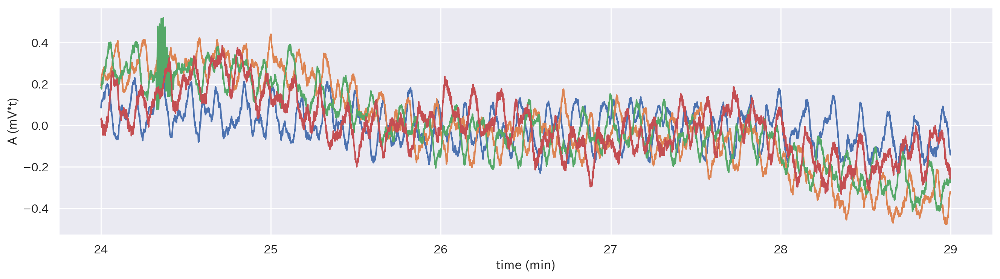

In [ ]:
# 平均を引き算することで、直流成分を引いたことにしてみた
#===========================================
time_head = 24
time_tail = 29
fq_high_limit = 60
#===========================================
plt.figure(figsize=(16, 4), dpi=200)
#for i in range(len(HPLC_cropped)):
for i in [1,6,7,18]:
    N = len(HPLC_cropped[i][0])
    dt = (HPLC_cropped[i][0].iat[-1] - HPLC_cropped[i][0].iat[0]) / N
    time_head_index = np.abs(np.array(HPLC_cropped[i][0]) - time_head).argmin()
    time_tail_index = np.abs(np.array(HPLC_cropped[i][0]) - time_tail).argmin()
    data = HPLC_cropped[i][1][time_head_index:time_tail_index]
    data_negative_average = data - np.average(data)
    filter = np.fft.fft(data_negative_average)
    filter_fq = np.linspace(0, 1.0/dt, len(filter))
    filter_ifft_real = np.fft.ifft(filter).real * 2
    plt.plot(HPLC_cropped[i][0][time_head_index:time_tail_index], filter_ifft_real)
plt.xlabel('time (min)')
plt.ylabel('A (mV*t)')

Text(0, 0.5, 'Amplitude')

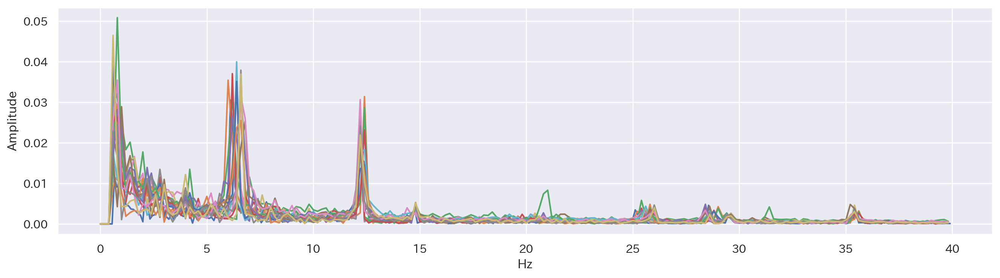

In [ ]:
# 後ろの穏やかな部分の範囲をフーリエ変換
# ０に近い周波数を直流成分と見て、強制的に０にした
#===========================================
time_head = 24
time_tail = 29
fq_head = 0
fq_tail = 40
fq_path_filter = 0.7
#===========================================
plt.figure(figsize=(16, 4), dpi=200)
for i in range(len(HPLC_cropped)):
#for i in [6,7,8,9,10]:
    N = len(HPLC_cropped[i][0])
    dt = (HPLC_cropped[i][0].iat[-1] - HPLC_cropped[i][0].iat[0]) / N
    filter = np.fft.fft(HPLC_cropped[i][1][time_head_index:time_tail_index])
    filter_fq = np.linspace(0, 1.0/dt, len(filter)) 
    fq_path_filter_index = np.abs(filter_fq - fq_path_filter).argmin()
    time_head_index = np.abs(np.array(HPLC_cropped[i][0]) - time_head).argmin()
    time_tail_index = np.abs(np.array(HPLC_cropped[i][0]) - time_tail).argmin()


# fq_path_filterより小さい周波数を直流成分と見て、強制的に０にした
    filter[:fq_path_filter_index]=0
    filter_fq = np.linspace(0, 1.0/dt, len(filter))
    filter_fq_head_index = np.abs(filter_fq - fq_head).argmin()
    filter_fq_tail_index = np.abs(filter_fq - fq_tail).argmin()
    filter_abs_amp = np.abs(filter) / len(filter) * 2
    filter_abs_amp[0] = filter_abs_amp[0] / 2

    plt.plot(filter_fq[filter_fq_head_index:filter_fq_tail_index], filter_abs_amp[filter_fq_head_index:filter_fq_tail_index])

plt.xlabel('Hz')
plt.ylabel('Amplitude')

Text(0, 0.5, 'A (mV*t)')

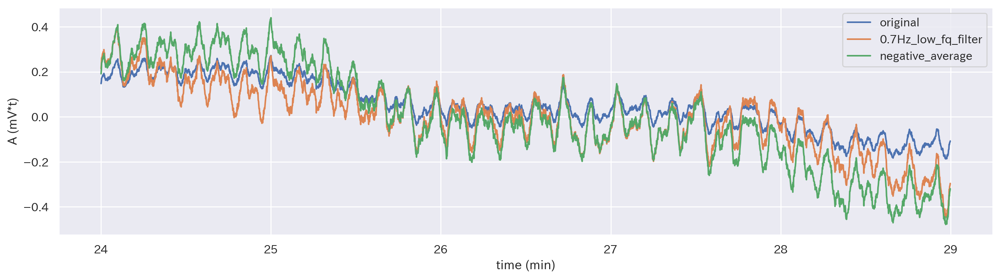

In [ ]:
# 直流成分の処理の仕方を比べてみる
#===========================================
time_head = 24
time_tail = 29
fq_path_filter = 0.7
#===========================================
plt.figure(figsize=(16, 4), dpi=200)
#for i in range(len(HPLC_cropped)):
for i in [6]:
    N = len(HPLC_cropped[i][0])
    dt = (HPLC_cropped[i][0].iat[-1] - HPLC_cropped[i][0].iat[0]) / N
    time_head_index = np.abs(np.array(HPLC_cropped[i][0]) - time_head).argmin()
    time_tail_index = np.abs(np.array(HPLC_cropped[i][0]) - time_tail).argmin()
    time_range = HPLC_cropped[i][0][time_head_index:time_tail_index]

    data = HPLC_cropped[i][1][time_head_index:time_tail_index]
    data_fq = np.linspace(0, 1.0/dt, len(data)) 
    fq_path_filter_index = np.abs(data_fq - fq_path_filter).argmin()
    f_low_fq_filter = np.fft.fft(data)
    f_low_fq_filter[:fq_path_filter_index]= 0
    f_around0_erase_ifft_real = np.fft.ifft(f_low_fq_filter).real * 2

    data_negative_average = data - np.average(data)
    f_negative_average = np.fft.fft(data_negative_average)
    f_negative_average_ifft_real = np.fft.ifft(f_negative_average).real * 2

    plt.plot(time_range, data, label='original')
    plt.plot(time_range, f_around0_erase_ifft_real, label=f'{fq_path_filter}Hz_low_fq_filter')
    plt.plot(time_range, f_negative_average_ifft_real, label='negative_average')
    plt.legend();

plt.xlabel('time (min)')
plt.ylabel('A (mV*t)')

Text(0, 0.5, 'A (mV*t)')

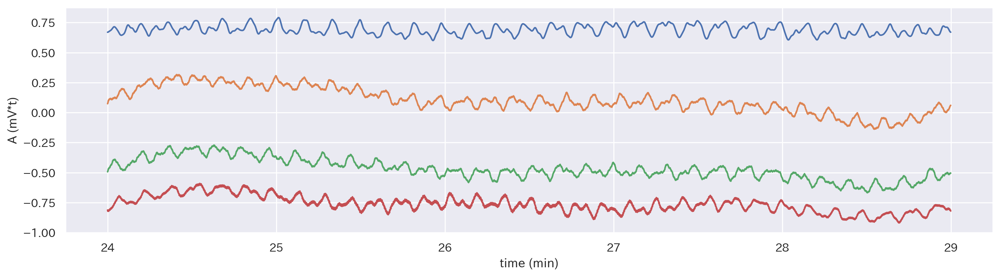

In [ ]:
# 後ろの穏やかな部分のフーリエ変換したやつで
# ピークを抽出して、その周波数のみで逆フーリエ変換してみた。
# 逆フーリエ変換したノイズは綺麗に再現しているように見える、
# 機械的な要因による、周期的なノイズの抽出は成功か？
#===========================================
time_head = 24
time_tail = 29

fq_head = 5 #穏やかな部分のピーク検出での区切り周波数、始め
fq_tail = 14 #穏やかな部分のピーク検出での区切り周波数、中1
fq_2nd_tail = 300 #穏やかな部分のピーク検出での区切り周波数、終わり
ac_1st_high = 0.02 #穏やかな部分をフーリエ変換した時の、振幅のピークの下限、周波数：0~始め
ac_2nd_high = 0.007 #穏やかな部分をフーリエ変換した時の、振幅のピークの下限、周波数：始め〜中
ac_3rd_high = 0.0025 #穏やかな部分をフーリエ変換した時の、振幅のピークの下限、周波数：中〜終わり
#===========================================
plt.figure(figsize=(16, 4), dpi=200)
#for i in range(len(HPLC_cropped)):
for i in [1,6,7,18]:
    N = len(HPLC_cropped[i][0])
    dt = (HPLC_cropped[i][0].iat[-1] - HPLC_cropped[i][0].iat[0]) / N
    time_head_index = np.abs(np.array(HPLC_cropped[i][0]) - time_head).argmin()
    time_tail_index = np.abs(np.array(HPLC_cropped[i][0]) - time_tail).argmin()
    data = HPLC_cropped[i][1][time_head_index:time_tail_index]
    
    filter = np.fft.fft(data)
    filter_abs_amp = np.abs(filter) / len(filter) * 2
    filter_abs_amp[0] = filter_abs_amp[0] / 2
    filter_fq = np.linspace(0, 1.0/dt, len(filter))
    filter_fq_head_index = np.abs(filter_fq - fq_head).argmin()
    filter_fq_tail_index = np.abs(filter_fq - fq_tail).argmin()
    filter_fq_2nd_tail_index = np.abs(filter_fq - fq_2nd_tail).argmin()
    #0~5Hzの間で、振幅がac_1st_high以下のものを、全体からカット
    filter[:filter_fq_head_index][filter_abs_amp[:filter_fq_head_index]<ac_1st_high]=0
    #5~14Hzの間で、振幅がac_2nd_high以下のものを、全体からカット
    filter[filter_fq_head_index:filter_fq_tail_index][filter_abs_amp[filter_fq_head_index:filter_fq_tail_index]<ac_2nd_high]=0
    #14~40Hzの間で、振幅がac_3rd_high以下のものを、全体からカット   
    filter[filter_fq_tail_index:filter_fq_2nd_tail_index][filter_abs_amp[filter_fq_tail_index:filter_fq_2nd_tail_index]<ac_3rd_high]=0
    #範囲外のものを全て0
    filter[filter_fq_2nd_tail_index:]=0

    filter_ifft_real = np.fft.ifft(filter).real * 2
    plt.plot(HPLC_cropped[i][0][time_head_index:time_tail_index], filter_ifft_real)

plt.xlabel('time (min)')
plt.ylabel('A (mV*t)')

Text(0, 0.5, 'A (mV*t)')

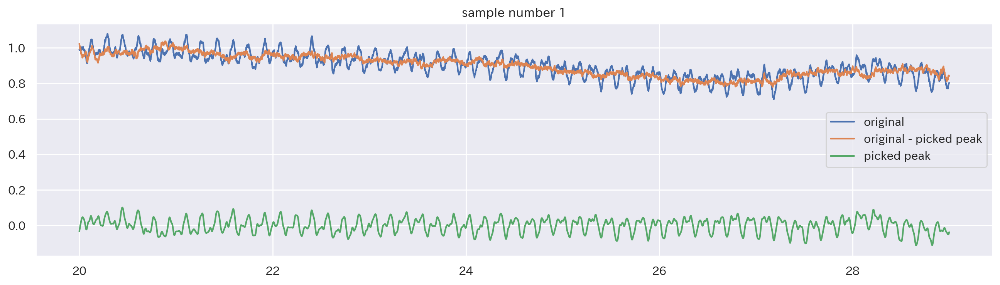

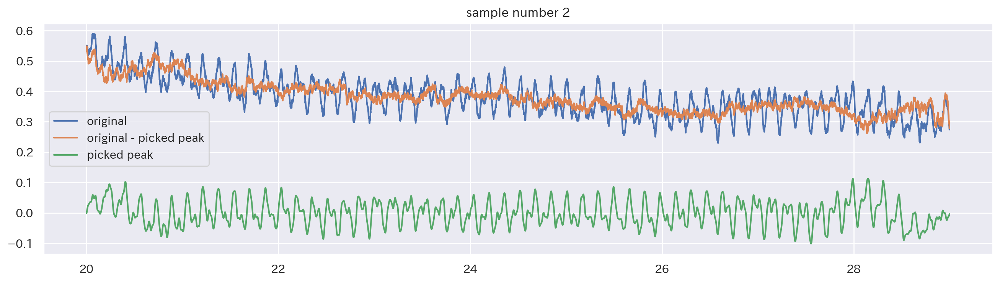

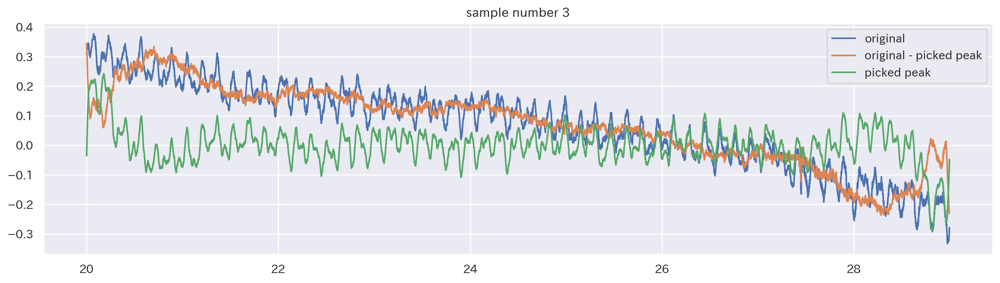

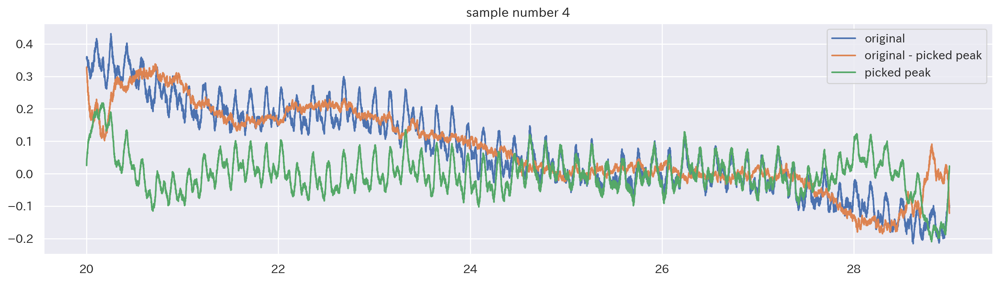

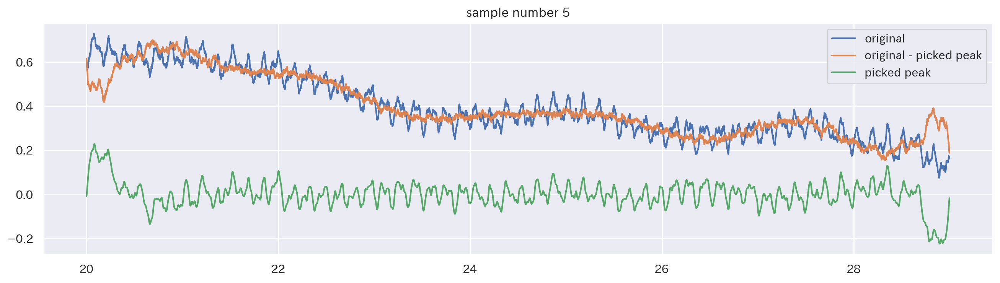

...

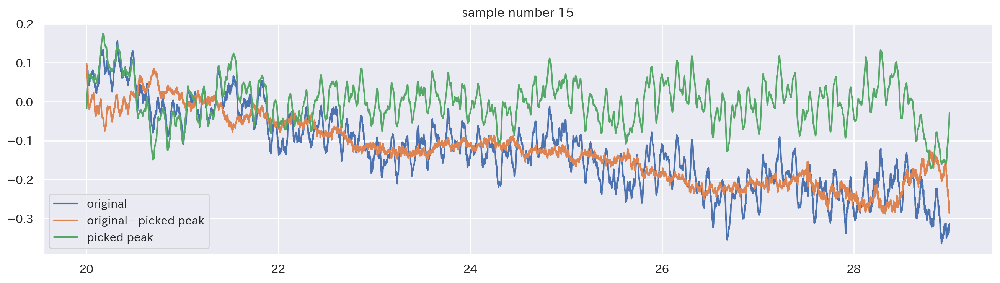

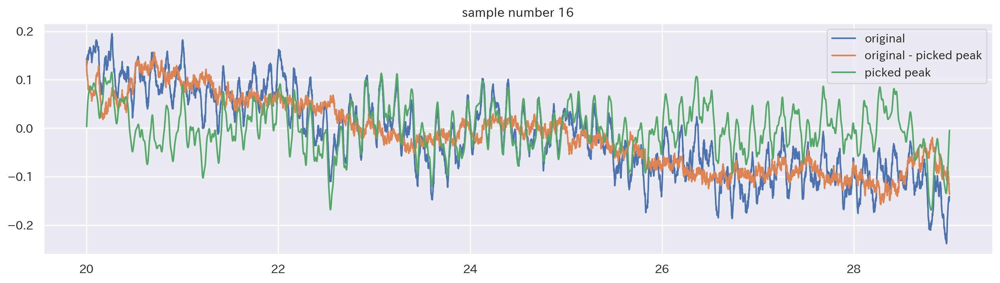

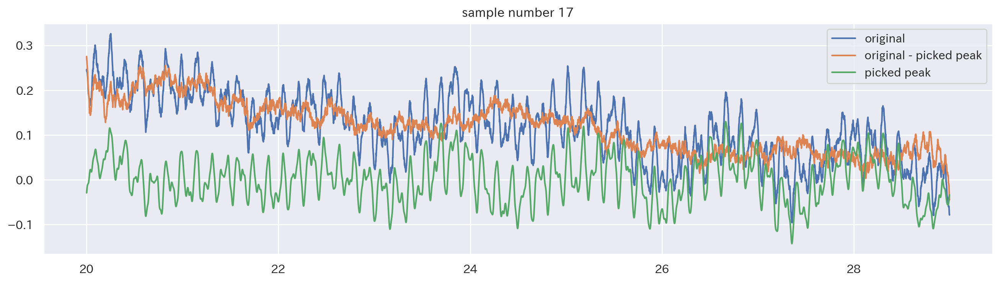

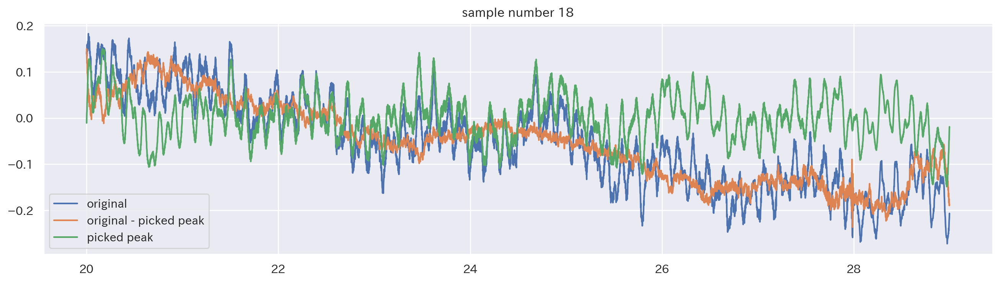

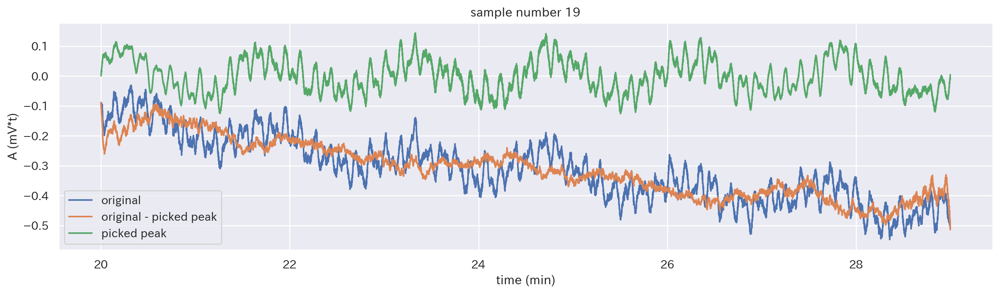

In [ ]:
# 末端部分をフーリエ変換したもので、振幅がピークになっている振動数を抽出して引き算した
# ノイズを引き伸ばしたい
#===========================================
fq_high_pass_filter = 60 #これより大きな周波数を全体からカット
amp_low_pass_filter = 0.002 #これより小さな振幅を全体からカット

time_head = 20 #穏やかな部分の開始時間
time_tail = 29 #穏やかな部分の終了時間
DC_filter = 0.7
fq_head = 5 #穏やかな部分のピーク検出での区切り周波数、始め
fq_tail = 14 #穏やかな部分のピーク検出での区切り周波数、中
fq_2nd_tail = 300 #穏やかな部分のピーク検出での区切り周波数、終わり
ac_1st_high = 0.007 #穏やかな部分をフーリエ変換した時の、振幅のピークの下限、周波数：始め〜中
ac_2nd_high = 0.0025 #穏やかな部分をフーリエ変換した時の、振幅のピークの下限、周波数：中〜終わり
ac_3rd_high = 0.0025 #穏やかな部分をフーリエ変換した時の、振幅のピークの下限、周波数：中〜終わり
#===========================================
#plt.figure(figsize=(16, 8), dpi=200)
for i in range(len(HPLC_cropped)):
#for i in [1,6,7,18]:
    #定数の準備（個数、時間幅、周波数、穏やかな部分の開始と終了の行番号）
    time_head_index = np.abs(np.array(HPLC_cropped[i][0]) - time_head).argmin()
    time_tail_index = np.abs(np.array(HPLC_cropped[i][0]) - time_tail).argmin()
    dt = (HPLC_cropped[i][0].iat[-1] - HPLC_cropped[i][0].iat[0]) / N

    #末端の穏やかな部分をフーリエ変換
    #平均を引き算する
    data = HPLC_cropped[i][1][time_head_index:time_tail_index]
    data_fq = np.linspace(0, 1.0/dt, len(data)) 
    DC_filter_index = np.abs(data_fq - DC_filter).argmin()
    filter = np.fft.fft(data)
    filter[:DC_filter_index]=0
    filter_abs_amp = np.abs(filter) / len(filter) * 2
    filter_abs_amp[0] = filter_abs_amp[0] / 2
    filter_fq = np.linspace(0, 1.0/dt, len(filter))
    filter_fq_head_index = np.abs(filter_fq - fq_head).argmin()
    filter_fq_tail_index = np.abs(filter_fq - fq_tail).argmin()
    filter_fq_2nd_tail_index = np.abs(filter_fq - fq_2nd_tail).argmin()
    #~5Hzの間で、振幅がac_1st_high以下のものを、全体からカット
    filter[:filter_fq_head_index][filter_abs_amp[:filter_fq_head_index]<ac_1st_high]=0
    #5~14Hzの間で、振幅がac_2nd_high以下のものを、全体からカット
    filter[filter_fq_head_index:filter_fq_tail_index][filter_abs_amp[filter_fq_head_index:filter_fq_tail_index]<ac_2nd_high]=0
    #14~40Hzの間で、振幅がac_3rd_high以下のものを、全体からカット   
    filter[filter_fq_tail_index:filter_fq_2nd_tail_index][filter_abs_amp[filter_fq_tail_index:filter_fq_2nd_tail_index]<ac_3rd_high]=0
    #範囲外のものを全て0
    filter[filter_fq_2nd_tail_index:]=0
    #逆フーリエ
    filter_ifft_real = np.fft.ifft(filter).real * 2
    #元データから 抽出したノイズを引き算した
    minus_filter = HPLC_cropped[i][1][time_head_index:time_tail_index] - filter_ifft_real

    plt.figure(figsize=(16, 4), dpi=200)
    plt.plot(HPLC_cropped[i][0][time_head_index:time_tail_index], HPLC_cropped[i][1][time_head_index:time_tail_index],label='original')
    plt.plot(HPLC_cropped[i][0][time_head_index:time_tail_index], minus_filter, label='original - picked peak')
    plt.plot(HPLC_cropped[i][0][time_head_index:time_tail_index], filter_ifft_real, label='picked peak')
    plt.title(f'sample number {i+1}')
    plt.legend();

#plt.xlim(8, 10.5)
#plt.ylim(3,8)
plt.xlabel('time (min)')
plt.ylabel('A (mV*t)')

(0.0, 4.0)

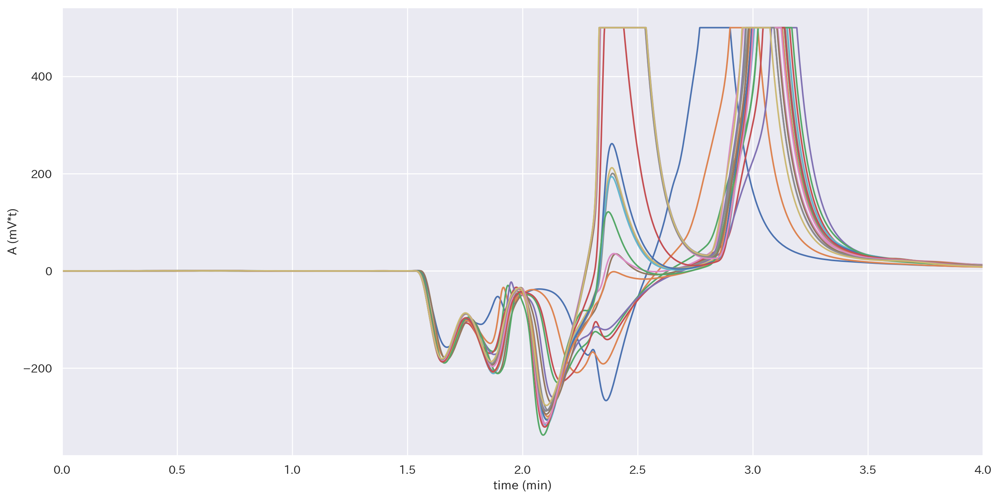

In [ ]:
# 先頭の方のデータも有効利用できないか？
fig, ax = plt.subplots(figsize=(16, 8), dpi=200)
#for i in range(7,8):
for i in range(len(HPLC_cropped)):
    plt.plot(HPLC_cropped[i][0], HPLC_cropped[i][1])
plt.xlabel('time (min)')
plt.ylabel('A (mV*t)')
plt.xlim(0, 4)

(1.0, 11.0)

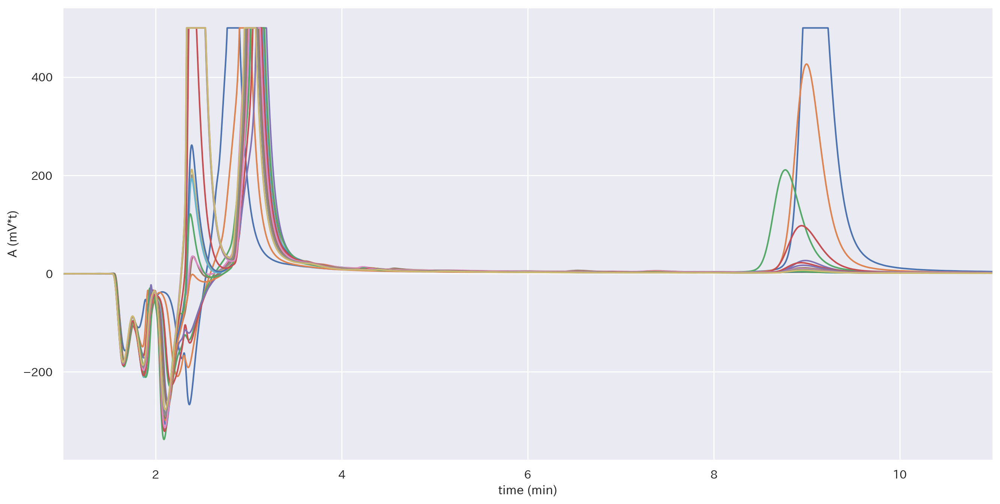

In [ ]:
# 青、オレンジのドパミン量が多いものは、
# 先頭の方の下向きの凹みが左に移動しているように見える
# これは、マイナスの電位を示す物質が少なくなったから？
fig, ax = plt.subplots(figsize=(16, 8), dpi=200)
#for i in range(7,8):
for i in range(len(HPLC_cropped)):
    plt.plot(HPLC_cropped[i][0], HPLC_cropped[i][1])
plt.xlabel('time (min)')
plt.ylabel('A (mV*t)')
plt.xlim(1, 11)

(-0.75, 0.25)

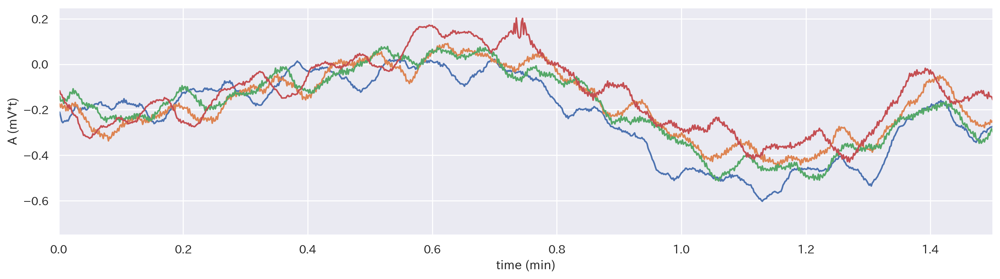

In [ ]:
# 先頭の0~1.5分の間の穏やかな部分をズームアップしてみたが、
# 平坦ではなかった
# なぜか
fig, ax = plt.subplots(figsize=(16, 4), dpi=200)
for i in [1,6,7,18]:
#for i in range(len(HPLC_cropped)):
    plt.plot(HPLC_cropped[i][0], HPLC_cropped[i][1])
ax.set_xlabel('time (min)')
ax.set_ylabel('A (mV*t)')
ax.set_xlim(0, 1.5)
ax.set_ylim(-0.75, 0.25)

Text(0, 0.5, 'Amplitude')

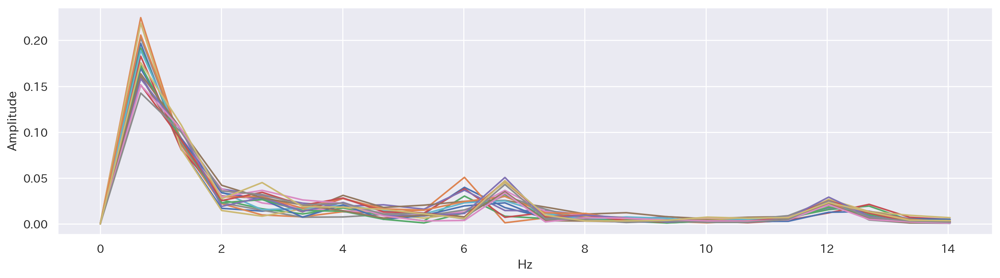

In [ ]:
# 0~1.5分の間の穏やかな部分の範囲をフーリエ変換、
# ※直列成分も引いてある
#===========================================
time_head = 0
time_tail = 1.5
fq_head = 0
fq_tail = 15
#===========================================
plt.figure(figsize=(16, 4), dpi=200)
for i in range(len(HPLC_cropped)):
#for i in [6,7,8,9,10]:
    N = len(HPLC_cropped[i][0])
    dt = (HPLC_cropped[i][0].iat[-1] - HPLC_cropped[i][0].iat[0]) / N
    fq = np.linspace(0, 1.0/dt, N) 
    time_head_index = np.abs(np.array(HPLC_cropped[i][0]) - time_head).argmin()
    time_tail_index = np.abs(np.array(HPLC_cropped[i][0]) - time_tail).argmin()

    data = HPLC_cropped[i][1][time_head_index:time_tail_index]
    data_negative_average = data - np.average(data)
    filter = np.fft.fft(data_negative_average)

    filter_fq = np.linspace(0, 1.0/dt, len(filter))
    filter_fq_head_index = np.abs(filter_fq - fq_head).argmin()
    filter_fq_tail_index = np.abs(filter_fq - fq_tail).argmin()
    filter_abs_amp = np.abs(filter) / len(filter) * 2
    filter_abs_amp[0] = filter_abs_amp[0] / 2

    plt.plot(filter_fq[filter_fq_head_index:filter_fq_tail_index], filter_abs_amp[filter_fq_head_index:filter_fq_tail_index])

plt.xlabel('Hz')
plt.ylabel('Amplitude')